In [2]:
import pickle

v30 = pickle.load(open('v30', 'rb'))
note8 = pickle.load(open('note8', 'rb'))
# 피클 파일 읽어오기

In [3]:
# 계산 시간 구하기
from time import time

def check_time(t0):
    dur = time() - t0
    print ("계산에 걸린시간 : {:.3f} 초 \n".format(dur))

In [4]:
# 그래프 한글 폰트
import matplotlib.pyplot as plt

plt.rcParams['font.family'] = 'AppleGothic'

In [5]:
v30.tail()

,id,sns_text
779,BlueSeanSan,갤노트8 30 아이폰…정면 승부 7 스마트폰 대전 신 삼국지三國志 삼성 아이...
780,DREAM_MD,전자의 기대작 30 국민체험단 모집 출처 지효대디 1 블로그
781,A7aLolo,415 국민의당 지지율 30 출고 서울 여행 덕질은라이트처럼 10주년 기념 비투...
782,tnqls119,현장 `갤노트8 40만 원 30 27만 원` 불법페이백 여전히 기승
783,shim5724,39갤노트8 나와39 30 가성비로 승부수…64 94만9300원 04 그놈의 호평...


In [6]:
note8.tail()

,id,sns_text
933,indigo_93,노트8 이랍니닷
934,jx464,삼성노트8로 그림 그리다 열불 오른쪽엔 거의 터치가안되서 안그려짐 44
935,yowasizi,헉 그런가요 노트처럼 펜이 내장되어 있는건줄 알았구큐 애플 제품을 써본 적이 없어...
936,_Tantei,아니 나 첨에 아빠가 뭔폰갖고싶냐고했을때 지금쓰는거 57인치보다 큰폰이면된다고햇거든...
937,_Tantei,나 오늘 아빠가 택배로 보내준 폰받앗는데 아니 노트8이야 존나비싼건...


* 정규처리 하는 과정에서 띄어쓰기가 각자 달라져서 한칸 초과의 띄어쓰기는 하나로 줄인다

In [7]:
import numpy as np
import re

In [8]:
# 긴 공백을 띄어쓰기 한 칸으로 바꾸기
# 내용에 숫자가 의미 없을 것 같아서 숫자도 제외
def remove_space(contents):
    array_contents = np.array(contents.sns_text)
    remove_text = [re.sub(r'\d+', '', i)for i in array_contents]
    remove_text = [re.sub(r'\s+', " ", i) for i in remove_text]
    
    return remove_text

    

In [9]:
v30_remove = remove_space(v30)
note8_remove = remove_space(note8)

In [10]:
# str로 변경 함수
from functools import reduce

def change_str(model):
    return reduce(lambda x, y: x+y, model)

In [11]:
# str 로 변경
from functools import reduce
v30_str = change_str(v30_remove)
note8_str = change_str(note8_remove)

# Konlpy의 twitter 를 이용한 성분분석


In [12]:
from konlpy.tag import Twitter
tw=Twitter()

### 형태소 분석 및 토크나이징

In [341]:
v30_pos = tw.pos(v30_str)
v30_pos[:10]


[('야마가타', 'Noun'),
 ('대학', 'Noun'),
 ('의', 'Josa'),
 ('강점', 'Noun'),
 ('은', 'Josa'),
 ('올', 'NounPrefix'),
 ('레드', 'Noun'),
 ('나스카', 'Noun'),
 ('지상화', 'Noun'),
 ('암', 'Noun')]

In [342]:
note8_pos = tw.pos(note8_str)
note8_pos[:10]


[('후', 'Noun'),
 ('노트', 'Noun'),
 ('계약', 'Noun'),
 ('하고', 'Josa'),
 ('왔', 'Verb'),
 ('다', 'Eomi'),
 ('기기', 'Noun'),
 ('가', 'Josa'),
 ('매장', 'Noun'),
 ('에', 'Josa')]

### 워드 클라우드를 그리기 위해서 단어만 뽑아낸다

In [15]:
# 명사 중 글자수1개와, stop words에 있는 단어는 추려낸다
# stop word : 공통적으로 있을 것 같은 스마트폰, 전자,/ 마케팅 단어
# '노트'라는 단어가 극단적으로 많기에 제외한다
def word_filter(contents):
    nouns = tw.nouns(contents)
    stop_words = open('text_file/stop_words.txt', mode = 'r',\
                      encoding='utf-8').read().split('\n')
    filter_nouns = [noun for noun in nouns if len(noun)> 1 and \
                 noun not in stop_words]
    return filter_nouns
    

In [16]:
v30_filter = word_filter(v30_str)
note8_filter = word_filter(note8_str)




In [513]:
import numpy as np

np.unique(v30_filter)

array(['가가', '가격', '가기', ..., '히든', '히트', '힐링'],
      dtype='<U6')

# NLTK
* nltk 패키지를 이용하여 많이 나오는 단어의 빈도수를 확인 할 수 있다

In [17]:
import nltk
import pprint as pp

In [18]:
def check_count_pos(model_name, pos):
    text = nltk.Text(pos, name = 'NMSC')
    print ('모델명: {}'.format(model_name))
    print ("토큰의 개수 : {}".format(len(text.tokens)))
    print ("unique 토큰의 개수 : {}".format(len(set(text.tokens))))
    print("상위 50개 빈도의 단어 : ")
    pp.pprint(text.vocab().most_common(50))
    
    print("Plot Chart")
    
    plt.figure(figsize = (20, 10))
    plt.rcParams.update({'font.size':20})
    text.plot(50)

모델명: v30
토큰의 개수 : 6312
unique 토큰의 개수 : 1869
상위 50개 빈도의 단어 : 
[('갤럭시', 122),
 ('뉴스', 103),
 ('카메라', 93),
 ('출처', 69),
 ('아이폰', 67),
 ('트와이스', 56),
 ('블락비', 50),
 ('촬영', 48),
 ('영상', 48),
 ('구글', 47),
 ('기능', 46),
 ('만원', 44),
 ('동영상', 43),
 ('비디오', 43),
 ('체험', 43),
 ('비교', 41),
 ('공개', 40),
 ('네이버', 38),
 ('사진', 37),
 ('블로그', 35),
 ('공유', 35),
 ('세로', 35),
 ('가격', 33),
 ('광고', 33),
 ('모두', 33),
 ('뮤비', 32),
 ('리뷰', 30),
 ('미국', 30),
 ('국내', 27),
 ('픽셀', 26),
 ('바이올렛', 25),
 ('사운드', 24),
 ('개봉', 24),
 ('플러스', 24),
 ('라벤더', 22),
 ('이번', 22),
 ('디스플레이', 21),
 ('후기', 21),
 ('모델', 21),
 ('다른', 21),
 ('디자인', 21),
 ('필름', 21),
 ('스펙', 21),
 ('전략', 21),
 ('가지', 20),
 ('음질', 19),
 ('프리미엄', 19),
 ('출고', 19),
 ('승부', 19),
 ('시장', 19)]
Plot Chart


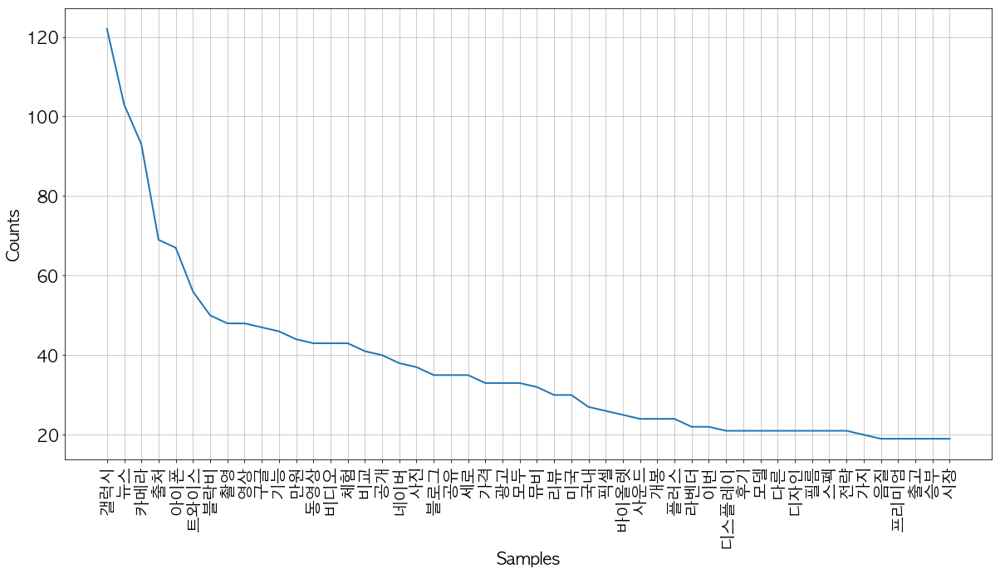

In [19]:
# V30
check_count_pos('v30',v30_filter)

모델명: note8
토큰의 개수 : 4779
unique 토큰의 개수 : 1976
상위 50개 빈도의 단어 : 
[('갤럭시', 179),
 ('아이폰', 95),
 ('화이트', 54),
 ('스톤', 51),
 ('너무', 41),
 ('강화유리', 39),
 ('케이스', 35),
 ('기능', 34),
 ('글라스', 33),
 ('출처', 33),
 ('액정', 30),
 ('진짜', 28),
 ('번역', 28),
 ('블로그', 26),
 ('오늘', 25),
 ('사진', 25),
 ('아직', 24),
 ('카메라', 24),
 ('고객', 23),
 ('그냥', 23),
 ('만원', 23),
 ('그림', 22),
 ('배터리', 22),
 ('지금', 21),
 ('사람', 20),
 ('최고', 20),
 ('화면', 20),
 ('보호', 19),
 ('개통', 18),
 ('느낌', 17),
 ('고민', 15),
 ('엣지', 15),
 ('뉴스', 15),
 ('핸드폰', 15),
 ('하나', 15),
 ('보고', 14),
 ('계속', 14),
 ('스타', 14),
 ('시간', 14),
 ('빅스', 14),
 ('아마존', 14),
 ('미국', 14),
 ('맥북', 14),
 ('어제', 13),
 ('이번', 13),
 ('때문', 13),
 ('후기', 13),
 ('노래', 13),
 ('가격', 13),
 ('화질', 13)]
Plot Chart


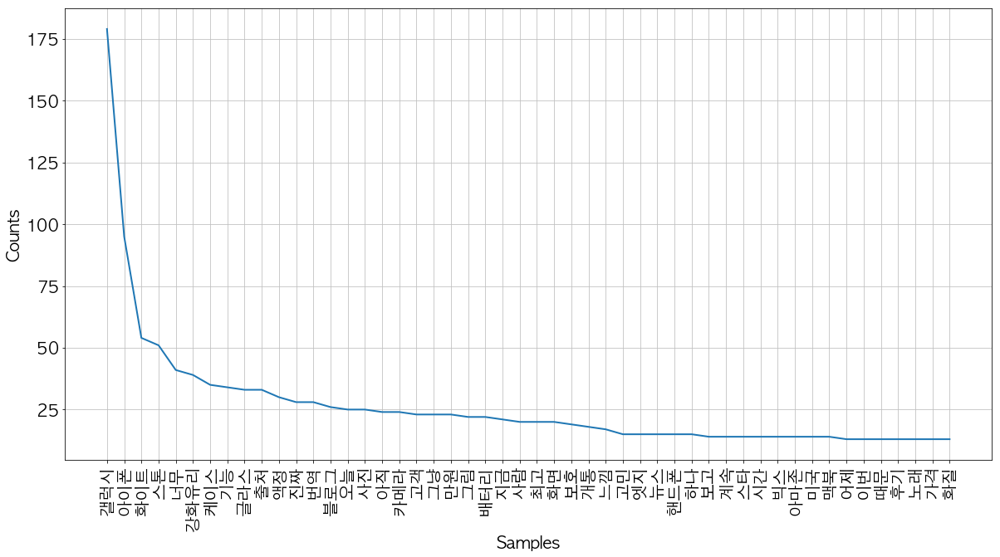

In [20]:
# note8
check_count_pos('note8',note8_filter)

# 워드 클라우드

In [21]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt
font_file = 'font/210 직장인의한마디R.ttf'
WC = WordCloud(font_path = font_file,\
              max_words = 2000)
#, width = 300, height = 300

In [22]:
def draw_wordcloud(contents):
    cloud_phone = WC.generate(' '.join(contents))
    
    plt.figure(figsize = (20, 20))
    plt.imshow(cloud_phone)
    plt.show()


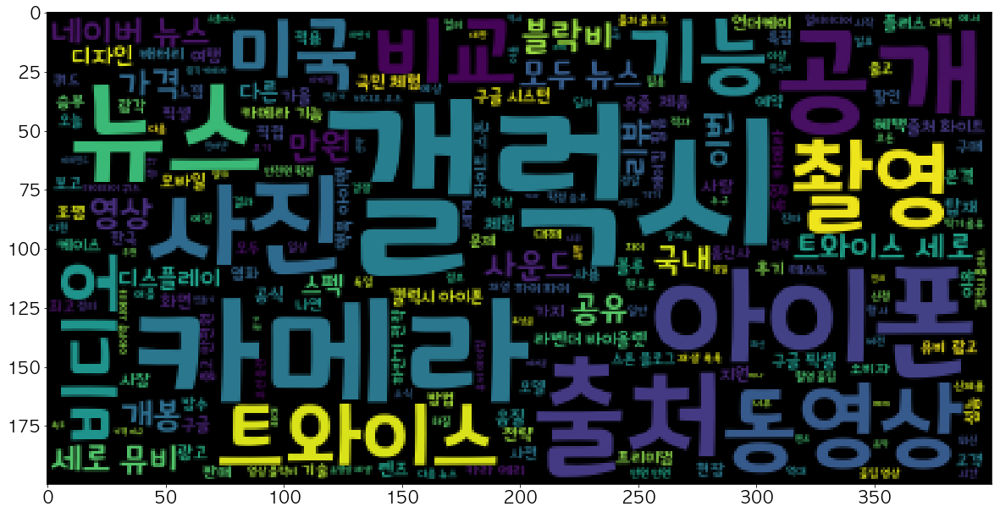

In [23]:
draw_wordcloud(v30_filter)

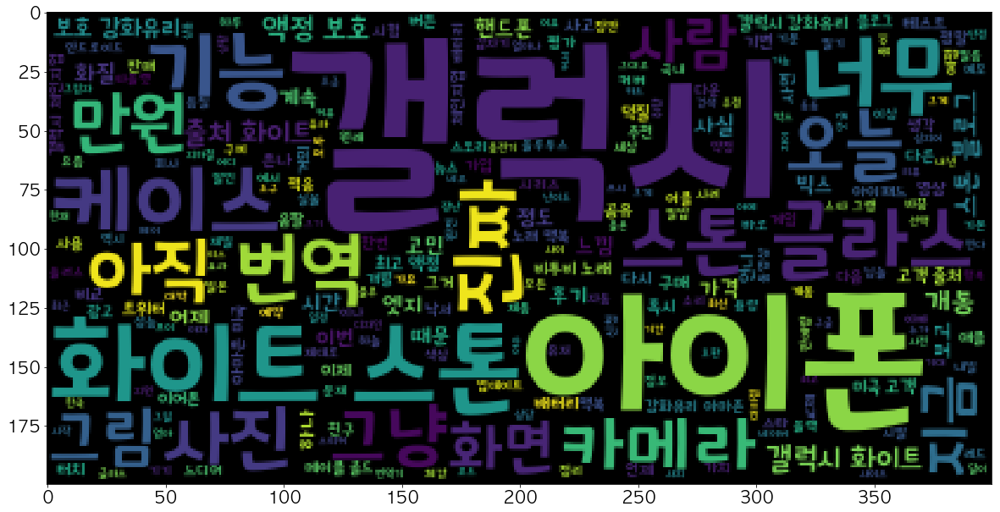

In [24]:
draw_wordcloud(note8_filter)

In [25]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt

font_file = 'font/210 직장인의한마디R.ttf'
WC = WordCloud(font_path = font_file,\
              max_words = 2000, width = 500, height = 500)


In [26]:
from PIL import Image
from wordcloud import STOPWORDS
import random

def grey_color_func(word, font_size, position, orientation, random_state=None,
                    **kwargs):
    return "hsl(0, 0%%, %d%%)" % random.randint(60, 100)

In [27]:
# mask 
v30_mask = np.array(Image.open('img_file/v30logo.png'))
note8_mask = np.array(Image.open('img_file/note8logo.png'))

In [28]:
def draw_wordcloud_mask(contents, mask, model_name):
    WC = WordCloud(font_path = font_file,\
              max_words = 2000, width = 1000, height = 2000,\
              mask = mask)
    cloud_phone = WC.generate(' '.join(contents))
    
    plt.imshow( WC.recolor(color_func = grey_color_func, random_state=3), interpolation = 'bilinear')
    # 회색조 지정
    #WC.to_file("{}_logo.png".format(model_name))

    plt.axis("off")
    plt.figure(figsize = (100, 100))
    plt.imshow(cloud_phone, interpolation='bilinear')
    plt.axis('off')
    plt.show()
    
    

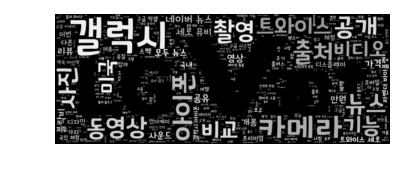

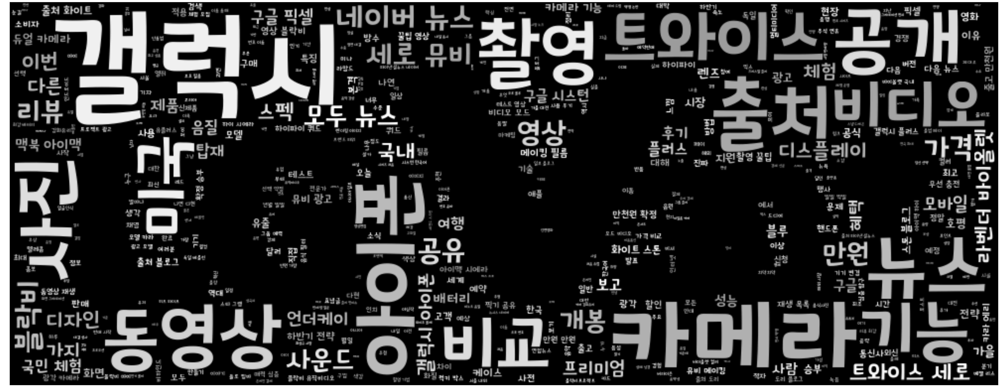

In [29]:
draw_wordcloud_mask(v30_filter, v30_mask, 'v30')

* 해당 핸드폰이 출시되기 전과 직후의 SNS임을 감안하였을 때 홍보글과 기대기능이 주를 이루었다
* 갤럭시가 많이 언급된 것으로 보아,v30에 관심을 가지고 있는 유저들은 비슷한 시기에 나오는 갤럭시 노트8과 비교를 하려는 흐름이 있는 것 같다
* V30이 주로 홍보하는 카메라기능과 연관된 카메라, 동영상, 촬영 등의 기대단어를 볼 수 있다

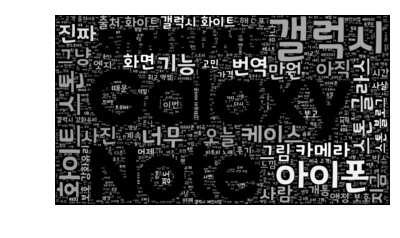

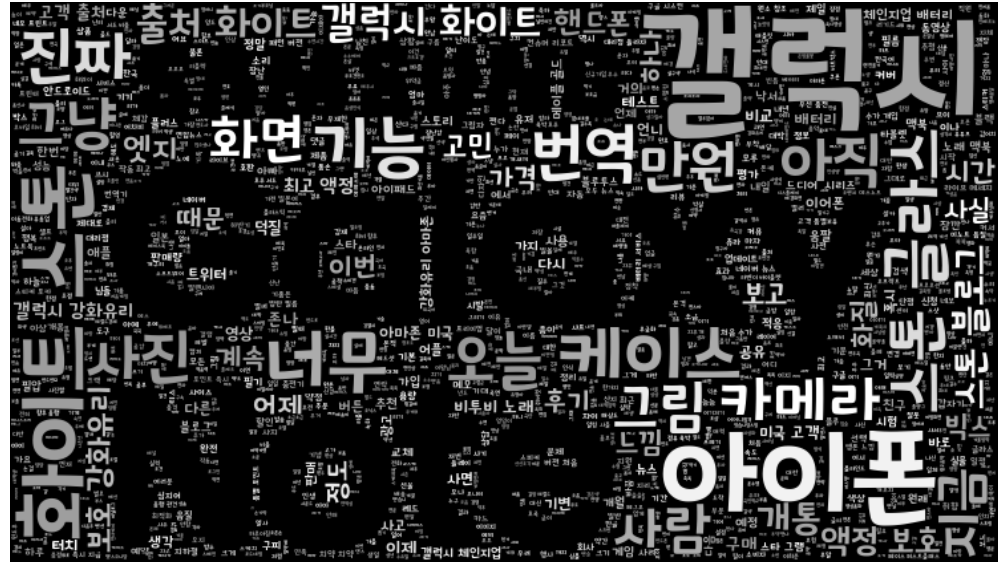

In [30]:
draw_wordcloud_mask(note8_filter, note8_mask, 'note8')

* v30에서는 갤럭시가 많이 언급 되었으나 갤럭시는 아이폰과의 비교를 하려는 추세. 엘지는 언급이 거의 되지 않는다는 것을 볼 수 있다
* 노트8은 한마디로 정해진 컨셉이 없어서 기능에 대한 언급은 없고, 화이트, 스톤 글라스처럼 디자인이나 외향에 대한 언급이 많다. 

In [ ]:
# input 시간 제한 trouble shooting
# jupyter notebook --NotebookApp.iopub_data_rate_limit=10000000000

# Word2Vec 을 해 보자


## 1) 토큰화 : cohesion tokenizer 이용
* Konlpy와 다르게 토크나이징 분석 대상 코퍼스의 출현 빈도를 학습한 결과를 토대로 토큰을 나눠주기 때문에 분석 품질이 비교적 좋다
* Word2Vec에 품사정보까지 넣을 필요는 없다
출처 : https://ratsgo.github.io/natural%20language%20processing/2017/03/08/word2vec/
https://github.com/lovit/soy/blob/master/tutorials/soy/Basic_tokenizers.ipynb

### Mongodb에서 정규표현 거치기 전의 데이터를 다시 불러온다

In [64]:
import pymongo 

mongo_server = '52.14.175.152'
mongo_port = 54329

from pymongo import MongoClient

mongo = MongoClient(mongo_server, mongo_port)

In [66]:
import pprint as pp

# mongodb 객체 생성
v30_dup = mongo.sns.v30_dup
note8_dup = mongo.sns.note8_dup

In [76]:
# 'text'의 중복을 배제하고 불러오는 함수
def mongo_distinct(mongo_object):
    
    result = mongo_object.distinct('text')
    contents_list = [i for i in result]
    print ("text 개수 : {}".format(len(contents_list)))
    return contents_list

In [78]:
v30_list = mongo_distinct(v30_dup)
v30_list[:10]

text 개수 : 784


['야마가타 대학의 강점은 올레드, 나스카 지상화, 암 치료입니다. 이들은 유망입니다. #삼성 #LG전자 #아이폰 #iPhone8 #iphonex #LGV30 #<b>V30</b> #GalaxyNote8 #갤럭시노트8  https://t.co/MJTS0ImRG0',
 '[IT다있다] 본격 색상마케팅!  - #<b>V30</b> #라벤더바이올렛, 출시  - #갤노트8  #메이플골드 출시 https://t.co/xGkZJAiZ8i https://t.co/lmr37tOVJg',
 'LG <b>V30</b> 블락비 MY Zone 뮤직비디오 촬영 꿀팁은?  https://t.co/Na1qlmzhGH #<b>V30</b> #블락비 #블락비뮤직비디오 #MYZONE #지코 #디오 #LGV30 #V30동영상 #V30꿀팁',
 '<b>V30</b> 라벤더 바이올렛의 UX, 솔직하게 평가해보니 과연?  #된다맥북아이맥 #하이시에라 #<b>V30</b> #LGV30 #플로팅바 #올웨이즈온디스플레이 #V30장단점 #UX #V30듀얼카메라 #V30라벤더바이올렛 https://t.co/I5nBtJ29xq',
 '[뉴스] 최상규 LG전자 사장, <b>V30</b> 판매량 묻는 질문에 &#34;잘 안팔려…&#34; 올 3분기 추정 적자는 2000억원대... ▶https://t.co/dhBZK8WAgx  #LG #<b>V30</b> #LGV30 #언더케이지 #underKG https://t.co/34DlV9FFbX',
 'LG <b>V30</b> 시네비디오 모드 사용하기! https://t.co/z1VmfdnqtW #<b>V30</b> #V30시네비디오 #V30동영상',
 'LG전자, <b>V30</b>로 찍은 ‘블락비’ 뮤직비디오 공개  #LG #LG전자 #<b>V30</b> #블락비 #BlockB  https://t.co/JLAMAveboF https://t.co/i60YiFvgS9',
 '페북지기 너 혼자 놀기 있기 없기?  트윗지기 빼고 혼자 다녀온 #<b>V30</b> 카메라 리뷰 

In [79]:
note8_list = mongo_distinct(note8_dup)
note8_list[:10]

text 개수 : 938


['후... <b>노트</b><b>8</b> 계약하고 왔다..... 기기가 매장에 없어서 오후에 퀵으로 쏴주는걸로.....',
 '허루ㅜㅜㅜㅜ<b>노트</b><b>8</b>케이스드디어이뿡고샄댜ㅠㅜㅠㅠㅠㅠㅠㅠ',
 '오늘 사랑하는 사람에게는 어떤 러브액션이 필요할까요? 치약을 펌핑하여 다트를 맞춰주세요! https://t.co/aL1zhB732J ##덴티스테 #덴티스테치약 #치약 #치약추천#이벤트 #이희준 # 갤럭시<b>노트</b><b>8</b> #갤노트8',
 '갤럭시 <b>노트</b><b>8</b> 일반판매 시작 https://t.co/9oL3LsxUvI #갤럭시노트8',
 '원래 <b>노트</b><b>8</b> 고민 하고있었는데 찬율님꺼 실물 보고 뽕차오름.....크킄 만족스럽군',
 '<b>노트</b><b>8</b>. 사전예약 고객 AAA시상식 티켓 응모관련. 추첨이 16일이었으나 넘나 잠잠하여 삼송 메일발송함. 사흘동안 답신없어서 전화하니 추첨지연이라함. 공지라도 하던지... 오늘 내일 추첨 후 개별문자로만 발송한다함 추첨여부는...영영 알수없는거임? https://t.co/r1qO8MBX6M',
 '@Tae_Garam <b>노트</b><b>8</b> 보다는 아이폰X가 좋지 않을까?',
 '나 전에 폰 알람이 오졋는데... 짜증나고 계속 반복돼고... <b>노트</b> <b>8</b> 알람 너무 조신한걸 좀더 짜증나는 소리 없나 다들 샹그릴라 해',
 '@MarioCho15 아이폰 X를 기다리고 있어요.. 근데 못 기다리고 <b>노트</b><b>8</b>을 좀 기웃거릴까 생각도 들어요.',
 '꿈속에서 폰 <b>노트</b><b>8</b>로 바꾸고 커뮤뛰려고 신청서팟어(대체)']

### 정규표현식
1. 링크: http://~
2. 워드 클라우드시는 영문을 다 삭제하였으나 좀 더 세밀하게
    
3. 문장에 방해되는 태그 및 키워드 삭제 : #한글, #영문
4. 기타 기호
    

In [80]:
import re

In [229]:
p_link= re.compile('http[s]*[:\/\\.\w]*')
p_html = re.compile('(<b>\w*<\/b>)')
p_at = re.compile('@\w*')
p_tag1 = re.compile('#[_\w\s]*')
p_tag2 = re.compile('(&;[\s\w\W]*&;)+(&[\w]*;)+')
p_tag3 = re.compile('[&lt;]*[&gt;]*')
p_from1 = re.compile('\[[\w]*\]*')
p_from2 = re.compile('\(출처[\s\w\W]*\)+')
p_specialcha = re.compile('[♡▶★☆●■⭐️♥➡✨✌→▲❤▼↓♥❤️✅�◀‼️❣❣❣️✅]*')

re_compile_list = [p_link,p_html,p_at,p_tag1,p_tag2,\
                  p_tag3,p_from1,p_from2,p_specialcha ]

In [244]:
def make_re(text_list):
    temp_list = []
    for text in text_list:
        temp_text = text
        for re_compile in re_compile_list:
        
            temp_text = re_compile.sub('',temp_text )
        
        temp_text = re.sub(r'\s+\W+', ' ', temp_text) # 띄어쓰기 정비 
        temp_list.append(temp_text)
    return temp_list
    
    

In [247]:
v30_list_re = make_re(v30_list)
v30_list_re[:5]


['야마가타 대학의 강점은 올레드, 나스카 지상화, 암 치료입니다. 이들은 유망입니다. ',
 ' 본격 색상마케팅! 출시 ',
 'LG 블락비 MY Zone 뮤직비디오 촬영 꿀팁은? ',
 ' 라벤더 바이올렛의 UX, 솔직하게 평가해보니 과연? ',
 ' 최상규 LG전자 사장, 판매량 묻는 질문에 잘 안팔려… 올 3분기 추정 적자는 2000억원대... ']

In [248]:
note8_list_re = make_re(note8_list)
note8_list_re[:5]

['후... 계약하고 왔다..... 기기가 매장에 없어서 오후에 퀵으로 쏴주는걸로.....',
 '허루ㅜㅜㅜㅜ케이스드디어이뿡고샄댜ㅠㅜㅠㅠㅠㅠㅠㅠ',
 '오늘 사랑하는 사람에게는 어떤 러브액션이 필요할까요? 치약을 펌핑하여 다트를 맞춰주세요! ',
 '갤럭시 일반판매 시작 ',
 '원래 고민 하고있었는데 찬율님꺼 실물 보고 뽕차오름.....크킄 만족스럽군']

## Soy

* sns는 특성상 (댓글이나 후기도 마찬가지 이겠지만) 신조어, 구어체가 많고 특정 제품등 대명사가 많이 등장한다. KoNLP는 지도학습으로 만들어진 사전형식이기 때문에 해당 부분의 자연어  토크나이징에 최적화 되어 있다고는 할 수 없다. 
* Soynlp는 비지도 학습의 자연어 처리 라이브러리로, 문맥을 파악하여 명사추출, 단어 추출 및 토크나이징을 하기 때문에 적용 해 볼 수 있을 것 같다

In [103]:
from pprint import pprint 
import sys
sys.path.append('../../../soy/')


In [104]:
from soynlp.tokenizer import RegexTokenizer, LTokenizer, MaxScoreTokenizer

## 1) RegexTokenizer
* 언어의 종류가 바뀌는 부분은 기본적으로 토크나이징 되어야 한다
* 정규표현식을 이용하여 언어가 달라지는 순간들을 띄어쓴다

In [349]:
tokenizer = RegexTokenizer()
regex_list = []
for sent in note8_list_re:
    regex_list.append(tokenizer.tokenize(sent))

regex_list[:5]

[['후',
  '...',
  '계약하고',
  '왔다',
  '.....',
  '기기가',
  '매장에',
  '없어서',
  '오후에',
  '퀵으로',
  '쏴주는걸로',
  '.....'],
 ['허루', 'ㅜㅜㅜㅜ', '케이스드디어이뿡고샄댜', 'ㅠㅜㅠㅠㅠㅠㅠㅠ'],
 ['오늘',
  '사랑하는',
  '사람에게는',
  '어떤',
  '러브액션이',
  '필요할까요',
  '?',
  '치약을',
  '펌핑하여',
  '다트를',
  '맞춰주세요',
  '!'],
 ['갤럭시', '일반판매', '시작'],
 ['원래', '고민', '하고있었는데', '찬율님꺼', '실물', '보고', '뽕차오름', '.....', '크킄', '만족스럽군']]

* sns 특성상 숫자 영어 등 언어의 종류가 다양하기 때문에 토큰화에는 맞지 않는 것 같다

## 2) 토크나이징 순서

1. sns text 를 txt 파일로 저장
2. wordextractor로 cohesion_forward점수를 계산하여 (한국어는L + [R]형태, L에 명사, 동사, 형용사, 부사 등 신조어나 의미가 변하는 단어들이 많이 오기 때문에 forward점수만 확인한다) score dictionary를 만든다
3. wordextractor로 잡아낼 수 없는 단어의 점수를 수기로 score dictionary에 추가한다.
4. score dictionary를 적용하여 tokenizing을 할 수 있다
* 추가 : 명사 추출기를 이용하여 뽑아 낸 단어로 word cloud를 다시 그려보면 좀 더 정확한 컨텐츠를 뽑아 낼 수 있을 것 같다

### 1) TXT 파일

In [346]:
def export_txt(sns_text, model_name):
    file_path = 'text_file/'+model_name+'_text'
    with open(file_path, 'w', encoding = 'utf-8') as f:
        for text in sns_text:
            f.write('{}\n'.format(text))

In [347]:
export_txt(note8_list_re, 'note8')
export_txt(v30_list_re, 'v30')

### 2) WordExtractor
* WordExtractor: 비지도 학습
* KoNLP는 지도학습이기에 알려지지 않은 단어가 오면 처리를 할 수 없다
* 도메인의 특별한 어구들을 알 수 없다. 

##### WordExtrator는 위 세가지 단어 가능 점수를 계산하여 준다
1. Branching Entropy
2. Accessor Variety
3. Cohesion Score
<br> def __init__(left_max_length=10, 
            right_max_length=6, 
            min_count=5, 
            verbose_points=100000, 
            min_cohesion_forward=0.1, 
            min_cohesion_backward=0.0, 
            max_droprate_cohesion=0.95, 
            max_droprate_leftside_frequency=0.95, 
            min_left_branching_entropy=0.0,
            min_right_branching_entropy=0.0, 
            min_left_accessor_variety=0, 
            min_right_accessor_variety=0, 
            remove_subwords=True)

In [351]:
from soynlp.word import WordExtractor

In [350]:
class Sentences:
    def __init__(self, fname):
        self.fname = fname
        self.length = 0
    def __iter__(self):
        with open(self.fname, encoding = 'utf-8') as f:
            for doc in f:
                doc = doc.strip()
                if not doc:
                    continue
                for sent in doc.split(' '):
                    yield sent
                    
    def __len__(self):
        if self.length ==0:
            with open(self.fname, encoding = 'utf-8') as f:
                for doc in f:
                    doc = doc.strip()
                    if not doc:
                        continue
                    self.length += len(doc.split(' '))
        return self.length
    

In [352]:
def make_sentences(model_name):
    corpus_fname = 'text_file/'+model_name+'_text'
    sentences = SentencesTry(corpus_fname)
    print('{} 문장 개수 : {}'.format(model_name, len(sentences)))
    return sentences

In [353]:
def make_wordextractor(model_name, min_count, min_cohesion_forward):
    word_extractor = WordExtractor(min_count = min_count, 
                                  min_cohesion_forward = min_cohesion_forward,
                                  min_right_branching_entropy=0.0)
    sentences = make_sentences(model_name)
    word_extractor.train(sentences)
    words = word_extractor.extract()
    return words

In [364]:
v30_words = make_wordextractor('v30',5, 0.05 )

v30 문장 개수 : 8483
training was done. used memory 0.378 Gb
all cohesion probabilities was computed. # words = 880
all branching entropies was computed # words = 603
all accessor variety was computed # words = 603


In [374]:
print (v30_words['트와이스'])
print('\n{} 단어 개수 : {} '.format('v30', len(v30_words)))

Scores(cohesion_forward=0.91626032707417904, cohesion_backward=0, left_branching_entropy=0, right_branching_entropy=0.6869615765973234, left_accessor_variety=0, right_accessor_variety=2, leftside_frequency=30, rightside_frequency=0)

v30 단어 개수 : 1014 


In [370]:
note8_words = make_wordextractor('note8', 5, 0.05)

note8 문장 개수 : 8214
training was done. used memory 0.378 Gb
all cohesion probabilities was computed. # words = 624
all branching entropies was computed # words = 365
all accessor variety was computed # words = 365


In [375]:
print (note8_words['빅스비'])
print('\n{} 단어 개수 : {} '.format('note8', len(note8_words)))

Scores(cohesion_forward=1.0, cohesion_backward=0, left_branching_entropy=0, right_branching_entropy=0, left_accessor_variety=0, right_accessor_variety=0, leftside_frequency=11, rightside_frequency=0)

note8 단어 개수 : 901 


* 최신 단어도 하나의 단어로 잘 구분하는 것을 알 수 있다

### 3) Making Score Dictionary

* WordExtractor가 계산하는 것은 다양한 종류의 단어 가능 점수들.
이를 잘 조합하여 원하는 점수를 만들 수도 있다 
* cohesion_forwards에 right_branching_entropy를 곱하는 방법이 있는데 (1) 주어진 글자가 유기적으로 연결되어 함께 자주 나타나고, '(2) 그 단어의 우측에 다양한 조사, 어미, 혹은 다른 단어가 등장하여 단어의 우측의 branching entropy가 높다는 의미



In [434]:
def word_score(score):
    import math 
    return (score.cohesion_forward * math.exp(score.right_branching_entropy))



In [467]:
def make_score_dict(words):
    
    score_dict = {}
    
    for word, score in sorted(words.items(), key=lambda x:word_score(x[1])):
        
        score_dict[word] = score.cohesion_forward # word_score에서 계산된 점수를 value로
    
    
    add_dict = {'매장': 0.8, '오후':0.7, '메모리':0.8, '케이스':1.0,\
               '출시': 0.5, '카메라':1.0, }
    
    
    return score_dict.update(add_dict)
#수기로 딕셔너리를 추가한다. update를 하니 type은 nonetype이 된다
    

In [468]:
v30_score_dict = make_score_dict(v30_words)
v30_score_dict

In [469]:
note8_score_dict = make_score_dict(note8_words)
note8_score_dict

### 4) Tokenizing

* MaxScoreTokenizer : 
    - 띄어쓰기가 잘 안되어 있는 문장의 경우, 단어라고 확신이 드는 부분부터 연속된 글자집합에서 잘라내어도 토크나이징이 된다. 
 - 장점은 각 도메인에 적절한 단어 점수를 손쉽게 변형할 수 있다는 점이다.
- 도메인에서 반드시 단어로 취급되어야 하는 글자들이 있다면 그들의 점수를 scores에 최대값으로 입력하면 된다. 
- flatten을 하지 않으면 list of list 형식으로 토크나이징 결과가 출력된다. (subword, begin, end, score, length), default는 True

<br>
* LTokenizer:
- 띄어쓰기가 잘 되어 있다면 한국어 문서의 경우에는 MaxScore Tokenizer를 이용할 필요가 없다. 
- 한국어는 L+[R]구조이기 때문이다
- 한 어절의 왼쪽에서부터 글자 점수가 가장 높은 부분을 기준으로 토크나이징을 한다.


* text 가 띄어쓰기가 잘 되어 있지 않은 경우가 있기 때문에 MaxTokenizer로 한다

In [470]:
def make_Maxtoken(contents, score_dict):
    max_tokenizer = MaxScoreTokenizer(scores = score_dict)
    token_list = [max_tokenizer.tokenize(i) for i in contents]
    return token_list

In [471]:
v30_token_list= make_Maxtoken(v30_list_re, v30_score_dict)
v30_token_list

[['야마가타', '대학의', '강점은', '올레드,', '나스카', '지상화,', '암', '치료입니다.', '이들은', '유망입니다.'],
 ['본격', '색상마케팅!', '출시'],
 ['LG', '블락비', 'MY', 'Zone', '뮤직비디오', '촬영', '꿀팁은?'],
 ['라벤더', '바이올렛의', 'UX,', '솔직하게', '평가해보니', '과연?'],
 ['최상규',
  'LG전자',
  '사장,',
  '판매량',
  '묻는',
  '질문에',
  '잘',
  '안팔려…',
  '올',
  '3분기',
  '추정',
  '적자는',
  '2000억원대...'],
 ['LG', '시네비디오', '모드', '사용하기!'],
 ['LG전자,', '로', '찍은', '블락비’', '뮤직비디오', '공개'],
 ['페북지기', '너', '혼자', '놀기', '있기', '없기?', '트윗지기', '빼고', '혼자', '다녀온', '더', '자세한'],
 ['직접', '체감해본', 'LG', '사운드의', '모든', '것!'],
 ['화면',
  '캡처',
  '방법과',
  'GIF',
  '캡처를',
  '이용한',
  '움짤',
  '만들기',
  '방법을',
  '정리',
  '했습니다.',
  'GIF',
  '캡처는',
  '잘',
  '활용하면',
  '인터넷에서',
  '유행하는',
  '재미있는',
  '움짤을',
  '만들수',
  '있습니다.'],
 ['LG',
  '을',
  '이용하면서',
  '알아두면',
  '좋은',
  '팁',
  '5가지를',
  '정리해',
  '보았습니다~',
  '이용자',
  '혹은',
  '구매',
  '희망하는',
  '분들은',
  '참고해보세요'],
 ['LG', '전후면', '광각', '카메라', '및', '셀카,', '동영상', '사용', '후기'],
 ['LG', '하이파이', '쿼드', 'DAC으로', '듣는', '음감', '및', '녹음', '성능은?'],
 ['안드로이드', '휴대

In [472]:
note8_token_list= make_Maxtoken(note8_list_re, note8_score_dict)
note8_token_list

[['후...', '계약하고', '왔다.....', '기기가', '매장에', '없어서', '오후에', '퀵으로', '쏴주는걸로.....'],
 ['허루ㅜㅜㅜㅜ케이스드', '디어이뿡고샄댜ㅠㅜㅠ', 'ㅠㅠㅠㅠㅠ'],
 ['오늘',
  '사랑하는',
  '사람에게는',
  '어떤',
  '러브액션이',
  '필요할까요?',
  '치약을',
  '펌핑하여',
  '다트를',
  '맞춰주세요!'],
 ['갤럭시', '일반판매', '시작'],
 ['원래', '고민', '하고있었는데', '찬율님꺼', '실물', '보고', '뽕차오름.....크', '킄', '만족스럽군'],
 ['.',
  '사전예약',
  '고객',
  'AAA시상식',
  '티켓',
  '응모관련.',
  '추첨이',
  '16일이었으나',
  '넘나',
  '잠잠하여',
  '삼송',
  '메일발송함.',
  '사흘동안',
  '답신없어서',
  '전화하니',
  '추첨지연이라함.',
  '공지라도',
  '하던지...',
  '오늘',
  '내일',
  '추첨',
  '후',
  '개별문자로만',
  '발송한다함',
  '추첨여부는...영영',
  '알수없는거임?'],
 ['보다는', '아이폰X가', '좋지', '않을까?'],
 ['나',
  '전에',
  '폰',
  '알람이',
  '오졋는데...',
  '짜증나고',
  '계속',
  '반복돼고...',
  '알람',
  '너무',
  '조신한걸',
  '좀더',
  '짜증나는',
  '소리',
  '없나',
  '다들',
  '샹그릴라',
  '해'],
 ['아이폰',
  'X를',
  '기다리고',
  '있어요..',
  '근데',
  '못',
  '기다리고',
  '을',
  '좀',
  '기웃거릴까',
  '생각도',
  '들어요.'],
 ['꿈속에서', '폰', '로', '바꾸고', '커뮤뛰려고', '신청서팟어(대체)'],
 ['Cosmic',
  'Bird',
  'HD',
  '패턴은',
  '3RD',
  '버전에',
  '처음',

### 5) Making New Wordcloud

* 명사 추출기를 이용한다

In [ ]:
from soynlp.noun import LRNounExtractor
from soynlp.word import WordExtractor

In [253]:
verbose = True
left_max_length = 10
right_max_length = 6
min_count = 5

word_extractor = WordExtractor()
noun_extractor = LRNounExtractor(None, \
                                verbose,
                                left_max_length,
                                right_max_length,
                                min_count,
                                word_extractor)






used default noun predictor; Sejong corpus predictor
used noun_predictor_sejong
2398 r features was loaded


In [480]:
def make_nouns(model_name):
   
    sentences = make_sentences(model_name)
    nouns = noun_extractor.train_extract(sentences, \
                                    minimum_noun_score = 0.3, 
                                    min_count = 100)
    print ('단어 수  = {}'. format(len(nouns)))
    top100(nouns, model_name)
    return nouns

#명사 점수 0.3점 이상
# 문서집합에서 등장한 빈도가 100번 이상인 단어들에서 명사를 추출

In [475]:
def k_words_a_line(top, k=5):
    def as_str(subtop):
        return '    '.join (["{} ({})".format(t[0], t[1][0])\
                            for t in subtop])
    num_line = len(top) // k if len(top) % k == 0 else (len(top) // k)+1
    sents = []
    
    for i in range(num_line):
        sents.append(as_str(top[i*k:(i+1)*k]))
    return '\n'.join(sents)

def frequency(word):
    return nouns[word].frequency if word in nouns else 0

In [490]:
def top100(nouns, model_name):
    top100 = sorted(nouns.items(), key = lambda x:frequency(x[0]),\
                   reverse = True)[:100]
    print ('\n{} 단어들\n'.format(model_name))
    print(k_words_a_line(top100))

In [491]:
v30_nouns = make_nouns('v30')

v30 문장 개수 : 8483
scanning completed
(L,R) has (889, 563) tokens
building lr-graph completed단어 수  = 178

v30 단어들

갤럭시 (74)    아이폰 (47)    삼성 (35)    V30 (5)    사은품 (8)
기능 (41)    사진 (26)    배터리 (17)    LG (579)    고객 (9)
최고 (8)    화면 (14)    사용 (23)    카메라 (76)    생각 (12)
사람 (12)    출시 (72)    느낌 (9)    사전예 (13)    가격 (22)
스마트폰 (83)    처음 (9)    이번 (20)    화질 (6)    영상 (44)
광고 (30)    음질 (11)    신청 (6)    애플 (8)    구글 (38)
성능 (13)    예약 (11)    하지 (5)    차이 (10)    국내 (28)
정리 (14)    동영상 (37)    승부수 (5)    추가 (6)    혜택 (11)
21일 (15)    리뷰 (20)    문제 (7)    탑재 (16)    10월 (7)
특징 (10)    가능 (8)    완료 (9)    사람들 (5)    돌아 (5)
체험단 (11)    5가지 (5)    14일 (7)    27 (5)    13일 (5)
통신사 (5)    강화 (11)    함께 (9)    OLED (12)    99 (9)
호평 (11)    음악 (6)    갤럭시노트 (55)    예상 (8)    나만 (6)
모두 (32)    출고 (17)    바이올렛 (21)    2017 (9)    멀티미디어 (8)
경쟁 (7)    삼성전자 (7)    MQA (6)    디스플레 (16)    기자 (6)
블루 (10)    적용 (13)    오늘 (8)    이용 (6)    소비자 (8)
갤럭시노트8 (52)    현장 (6)    이야기 (6)    가을 (10)    시장 (9)


In [492]:
note8_nouns = make_nouns('note8')

note8 문장 개수 : 8214
scanning completed
(L,R) has (754, 434) tokens
building lr-graph completed단어 수  = 126

note8 단어들

갤럭시 (150)    아이폰 (88)    삼성 (35)    강화유리 (34)    돔글라스 (32)
V30 (32)    액정 (29)    사은품 (27)    번역 (26)    기능 (26)
진짜 (25)    아직 (24)    그림 (23)    사진 (23)    배터리 (22)
케이스 (21)    LG (20)    고객 (20)    사고 (20)    최고 (19)
화면 (19)    개통 (18)    사용 (18)    카메라 (18)    지금 (18)
액정보호 (17)    가입 (15)    생각 (15)    고민 (14)    하나 (14)
스마트 (14)    어제 (14)    사람 (13)    출시 (13)    느낌 (13)
엣지 (13)    사전예 (13)    가격 (12)    S8 (12)    한달 (12)
살까 (12)    스마트폰 (12)    처음 (11)    아이폰7 (11)    이번 (11)
후기 (11)    화질 (11)    영상 (11)    빅스비 (11)    혹시 (10)
안드 (10)    덕질 (10)    S펜 (10)    터치 (10)    트위터 (10)
정도 (9)    사이 (9)    체인지업 (9)    시간 (9)    신기 (9)
그거 (9)    갖고 (8)    적응 (8)    보다 (8)    256기 (8)
샀다 (8)    언제 (8)    광고 (8)    s8 (8)    음질 (8)
언니 (8)    이어폰 (8)    아이폰X (8)    친구 (7)    스티커 (7)
신청 (7)    필요 (7)    안드로이드 (7)    대리점 (7)    서비스 (7)
완벽 (7)    불편 (7)    때문 (7)    유저 (6)    애

In [493]:
note8_nouns

{'1위': NounScore(frequency=6, score=0.6664033333333333, known_r_ratio=1.0),
 '256기': NounScore(frequency=8, score=0.997334, known_r_ratio=1.0),
 'LG': NounScore(frequency=20, score=0.505755, known_r_ratio=1.0),
 'S8': NounScore(frequency=12, score=0.8, known_r_ratio=0.8333333333333334),
 'S펜': NounScore(frequency=10, score=0.6680056666666667, known_r_ratio=0.8571428571428571),
 'V30': NounScore(frequency=32, score=0.7993312, known_r_ratio=0.7142857142857143),
 's7': NounScore(frequency=5, score=0.99883, known_r_ratio=1.0),
 's8': NounScore(frequency=8, score=0.7522925, known_r_ratio=1.0),
 '가격': NounScore(frequency=12, score=0.999185, known_r_ratio=0.5),
 '가입': NounScore(frequency=15, score=0.8298360000000001, known_r_ratio=0.8571428571428571),
 '강화유리': NounScore(frequency=34, score=0.4999335, known_r_ratio=0.10526315789473684),
 '갖고': NounScore(frequency=8, score=0.6639120000000001, known_r_ratio=1.0),
 '개통': NounScore(frequency=18, score=0.9944702, known_r_ratio=0.5555555555555556),


In [499]:
note8_nouns[list(note8_nouns.keys())[0]].frequency

8

In [523]:
def make_wordcloud_contents(nouns):
    cloud_list = {}
    inner_list = []
    count = len(list(nouns.keys()))
    
    for i in range(count):
        for j in range(nouns[list(nouns.keys())[i]].frequency):
            
            
            
        cloud_list[list(nouns.keys())[i]]=nouns[list(nouns.keys())[i]].frequency
        
    
            
    return cloud_list


In [524]:
temp_list = make_wordcloud_contents(note8_nouns)

In [525]:
temp_list

{'1위': 6,
 '256기': 8,
 'LG': 20,
 'S8': 12,
 'S펜': 10,
 'V30': 32,
 's7': 5,
 's8': 8,
 '가격': 12,
 '가입': 15,
 '강화유리': 34,
 '갖고': 8,
 '개통': 18,
 '갤7': 5,
 '갤럭시': 150,
 '것인': 6,
 '고객': 20,
 '고민': 14,
 '골드': 6,
 '광고': 8,
 '구글': 6,
 '구모': 5,
 '국내': 5,
 '그거': 9,
 '그림': 23,
 '기능': 26,
 '기대': 6,
 '기본': 6,
 '기분': 5,
 '기종': 6,
 '느낌': 13,
 '대리점': 7,
 '덕질': 10,
 '돔글라스': 32,
 '동영상': 5,
 '들뜸': 5,
 '때문': 7,
 '맥북': 5,
 '메모': 6,
 '배터리': 22,
 '버전': 5,
 '번역': 26,
 '보다': 8,
 '보호': 5,
 '불편': 7,
 '빅스비': 11,
 '사고': 20,
 '사람': 13,
 '사야': 5,
 '사용': 18,
 '사은품': 27,
 '사이': 9,
 '사전예': 13,
 '사진': 23,
 '살까': 12,
 '삼성': 35,
 '샀다': 8,
 '생각': 15,
 '서비스': 7,
 '성능': 6,
 '소리': 6,
 '스마트': 14,
 '스마트폰': 12,
 '스토리': 6,
 '스티커': 7,
 '시간': 9,
 '신기': 9,
 '신청': 7,
 '아빠': 5,
 '아이폰': 88,
 '아이폰7': 11,
 '아이폰X': 8,
 '아직': 24,
 '안드': 10,
 '안드로이드': 7,
 '앙스타': 6,
 '애플': 6,
 '액정': 29,
 '액정보호': 17,
 '어제': 14,
 '언니': 8,
 '언제': 8,
 '엣지': 13,
 '영상': 11,
 '예약': 5,
 '완벽': 7,
 '움짤': 6,
 '유저': 6,
 '음질': 8,
 '이번': 11,
 '이어폰': 8,
 '자동': 5,
 '작동': 

In [529]:
from wordcloud import WordCloud

plt.figure(figsize=(12,8))
wordcloud = WordCloud(font_path = font_file).generate_from_frequencies(temp_list)

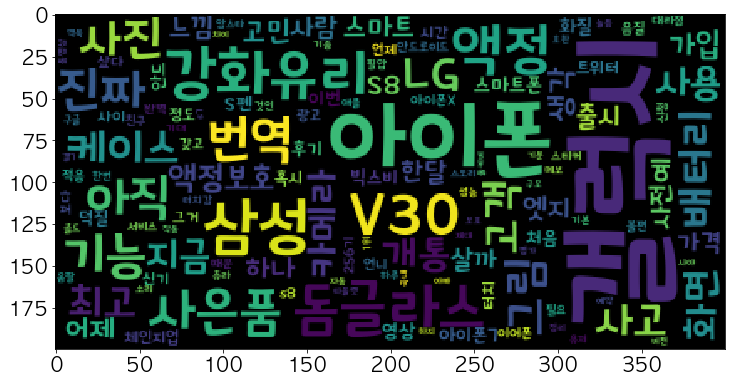

In [530]:
plt.imshow(wordcloud)
plt.show()